#***#Task4*-Timeline Analysis : Covid-19**

**Intern name- Rahul Rajeev Mudatholy**

**1.Problem Statement**-Create a storyboard showing spread of Covid-19 cases in your country or any
region (Asia, Europe, BRICS etc)
Identify interesting patterns and possible reasons helping Covid-19 spread
with basic as well as advanced charts

**2.Data**-: https://bit.ly/30d2gdi

In [ ]:
!pip install pycountry_convert
!pip install folium

In [ ]:

import pycountry_convert
import folium
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker
import pycountry_convert as pc
import folium
import branca
from datetime import datetime, timedelta,date
from scipy.interpolate import make_interp_spline, BSpline
import plotly.express as px
import json, requests
#from keras.layers import Input, Dense, Activation, LeakyReLU
#from keras import models
#from keras.optimizers import RMSprop, Adam
%matplotlib inline


In [ ]:
df_covid19=pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")

In [ ]:
df_covid19.head()

,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3
0,Afghanistan,2020-10-20 10:24:10,33.93911,67.709953,40287.0,1497.0,33760.0,5030.0,103.490154,NaN,NaN,3.715839,4,AFG
1,Albania,2020-10-20 10:24:10,41.15330,20.168300,17350.0,454.0,10167.0,6729.0,602.891097,NaN,NaN,2.616715,8,ALB
2,Algeria,2020-10-20 10:24:10,28.03390,1.659600,54616.0,1865.0,38215.0,14536.0,124.548919,NaN,NaN,3.414750,12,DZA
3,Andorra,2020-10-20 10:24:10,42.50630,1.521800,3623.0,62.0,2273.0,1288.0,4689.057141,NaN,NaN,1.711289,20,AND
4,Angola,2020-10-20 10:24:10,-11.20270,17.873900,7829.0,248.0,3031.0,4550.0,23.820776,NaN,NaN,3.167710,24,AGO


In [ ]:
df_confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')


In [ ]:
df_confirmed.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,...,38572,38606,38641,38716,38772,38815,38855,38872,38883,38919,39044,39074,39096,39145,39170,39186,39192,39227,39233,39254,39268,39285,39290,39297,39341,39422,39486,39548,39616,39693,39703,39799,39870,39928,39994,40026,40073,40141,40200,40287
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,10860,11021,11185,11353,11520,11672,11816,11948,12073,12226,12385,12535,12666,12787,12921,13045,13153,13259,13391,13518,13649,13806,13965,14117,14266,14410,14568,14730,14899,15066,15231,15399,15570,15752,15955,16212,16501,16774,17055,17350
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,47488,47752,48007,48254,48496,48734,48966,49194,49413,49623,49826,50023,50214,50400,50579,50754,50914,51067,51213,51368,51530,51690,51847,51995,52136,52270,52399,52520,52658,52804,52940,53072,53325,53399,53584,53777,53998,54203,54402,54616
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1301,1344,1344,1344,1438,1438,1483,1483,1564,1564,1564,1681,1681,1753,1753,1836,1836,1836,1966,1966,2050,2050,2110,2110,2110,2370,2370,2568,2568,2696,2696,2696,2995,2995,3190,3190,3377,3377,3377,3623
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3217,3279,3335,3388,3439,3569,3675,3789,3848,3901,3991,4117,4236,4363,4475,4590,4672,4718,4797,4905,4972,5114,5211,5370,5402,5530,5725,5725,5958,6031,6246,6366,6488,6680,6846,7096,7222,7462,7622,7829


In [ ]:
df_deaths= pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')

In [ ]:
df_deaths.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1420,1420,1420,1420,1425,1426,1436,1436,1437,1437,1441,1444,1445,1446,1451,1451,1453,1453,1455,1458,1458,1458,1458,1462,1462,1466,1467,1469,1470,1472,1473,1477,1479,1480,1481,1481,1485,1488,1492,1497
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,324,327,330,334,338,340,343,347,353,358,362,364,367,370,370,373,375,377,380,384,387,388,389,392,396,400,403,407,411,413,416,420,424,429,434,439,443,448,451,454
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1591,1599,1605,1612,1620,1632,1645,1654,1659,1665,1672,1679,1689,1698,1703,1707,1711,1714,1719,1726,1736,1741,1749,1756,1760,1768,1768,1771,1783,1789,1795,1801,1809,1818,1827,1827,1841,1846,1856,1865
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,53,54,55,55,55,57,57,59,59,59,59,59,62
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,130,131,132,134,136,139,143,144,147,147,152,154,155,159,162,167,171,174,176,179,183,185,189,193,195,199,211,211,208,212,218,218,219,222,227,228,234,241,247,248


In [ ]:
df_recovered = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv")

In [ ]:
df_recovered.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,31129,31154,31234,31638,32073,32098,32503,32505,32576,32576,32576,32576,32576,32610,32619,32619,32635,32642,32642,32746,32789,32842,32842,32842,32852,32879,32977,33045,33058,33058,33064,33114,33118,33308,33354,33447,33516,33561,33614,33760
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,6346,6443,6494,6569,6615,6668,6733,6788,6831,6888,6940,6995,7042,7139,7239,7309,7397,7397,7629,7732,7847,8077,8342,8536,8675,8825,8965,9115,9215,9304,9406,9500,9585,9675,9762,9864,9957,10001,10071,10167
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,33562,33723,33875,34037,34204,34385,34517,34675,34818,34923,35047,35180,35307,35428,35544,35654,35756,35860,35962,36063,36174,36282,36385,36482,36578,36672,36763,36857,36958,37067,37170,37170,37382,37492,37603,37603,37856,37971,38088,38215
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,938,943,943,943,945,945,1054,1054,1164,1164,1164,1199,1199,1203,1203,1263,1263,1263,1265,1265,1432,1432,1540,1540,1540,1615,1615,1715,1715,1814,1814,1814,1928,1928,2011,2011,2057,2057,2057,2273
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1277,1288,1289,1301,1324,1332,1401,1405,1443,1445,1445,1449,1462,1473,1503,1554,1639,1707,1813,1833,1941,2082,2215,2436,2577,2591,2598,2598,2635,2685,2716,2743,2744,2761,2801,2928,3012,3022,3030,3031


In [ ]:
df_table=pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv")

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (11) have mixed types.Specify dtype option on import or set low_memory=False.



In [ ]:
df_table.head()

,Country_Region,Last_Update,Confirmed,Deaths,Recovered,Active,Delta_Confirmed,Delta_Recovered,Incident_Rate,People_Tested,People_Hospitalized,Province_State,FIPS,UID,iso3,Report_Date_String,Delta_Deaths
0,Afghanistan,1/22/20,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/22,0.0
1,Afghanistan,1/23/20,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/23,0.0
2,Afghanistan,1/24/20,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/24,0.0
3,Afghanistan,1/25/20,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/25,0.0
4,Afghanistan,1/26/20,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/26,0.0


In [ ]:
df_covid19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 189 entries, 0 to 188
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Country_Region       189 non-null    object 
 1   Last_Update          189 non-null    object 
 2   Lat                  187 non-null    float64
 3   Long_                187 non-null    float64
 4   Confirmed            189 non-null    float64
 5   Deaths               189 non-null    float64
 6   Recovered            185 non-null    float64
 7   Active               189 non-null    float64
 8   Incident_Rate        187 non-null    float64
 9   People_Tested        0 non-null      float64
 10  People_Hospitalized  0 non-null      float64
 11  Mortality_Rate       189 non-null    float64
 12  UID                  189 non-null    int64  
 13  ISO3                 187 non-null    object 
dtypes: float64(10), int64(1), object(3)
memory usage: 20.8+ KB


##**Preprocessing**

In [ ]:
df_confirmed = df_confirmed.rename(columns={"Province/State":"state","Country/Region": "country"})

df_deaths = df_deaths.rename(columns={"Province/State":"state","Country/Region": "country"})

df_covid19 = df_covid19.rename(columns={"Country_Region": "country"})

df_recovered = df_recovered.rename(columns={"Province/State":"state","Country/Region":
"country"})

In [ ]:
#ACTIVE CASES
df_covid19["Active"] = df_covid19["Confirmed"]-df_covid19["Recovered"]-df_covid19["Deaths"]

In [ ]:
df_covid19.head()

,country,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3
0,Afghanistan,2020-10-20 10:24:10,33.93911,67.709953,40287.0,1497.0,33760.0,5030.0,103.490154,NaN,NaN,3.715839,4,AFG
1,Albania,2020-10-20 10:24:10,41.15330,20.168300,17350.0,454.0,10167.0,6729.0,602.891097,NaN,NaN,2.616715,8,ALB
2,Algeria,2020-10-20 10:24:10,28.03390,1.659600,54616.0,1865.0,38215.0,14536.0,124.548919,NaN,NaN,3.414750,12,DZA
3,Andorra,2020-10-20 10:24:10,42.50630,1.521800,3623.0,62.0,2273.0,1288.0,4689.057141,NaN,NaN,1.711289,20,AND
4,Angola,2020-10-20 10:24:10,-11.20270,17.873900,7829.0,248.0,3031.0,4550.0,23.820776,NaN,NaN,3.167710,24,AGO


In [ ]:
df_covid19.country.value_counts()

West Bank and Gaza    1
Cameroon              1
Togo                  1
Sri Lanka             1
Sudan                 1
                     ..
Bahrain               1
Ireland               1
Grenada               1
Luxembourg            1
Iceland               1
Name: country, Length: 189, dtype: int64

In [ ]:
# Changing the conuntry names as required by pycountry_convert Lib
df_confirmed.loc[df_confirmed['country'] == "US", "country"] = "USA"
df_deaths.loc[df_deaths['country'] == "US", "country"] = "USA"
df_covid19.loc[df_covid19['country'] == "US", "country"] = "USA"
df_table.loc[df_table['Country_Region'] == "US", "Country_Region"] = "USA"
# df_recovered.loc[df_recovered['country'] == "US", "country"] = "USA"
df_confirmed.loc[df_confirmed['country'] == 'Korea, South', "country"] = 'South Korea'
df_deaths.loc[df_deaths['country'] == 'Korea, South', "country"] = 'South Korea'
df_covid19.loc[df_covid19['country'] == "Korea, South", "country"] = "South Korea"
df_table.loc[df_table['Country_Region'] == "Korea, South", "Country_Region"] = "South Korea"
# df_recovered.loc[df_recovered['country'] == 'Korea, South', "country"] = 'South Korea'
df_confirmed.loc[df_confirmed['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_deaths.loc[df_deaths['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_covid19.loc[df_covid19['country'] == "Taiwan*", "country"] = "Taiwan"
df_table.loc[df_table['Country_Region'] == "Taiwan*", "Country_Region"] = "Taiwan"
# df_recovered.loc[df_recovered['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_confirmed.loc[df_confirmed['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'

df_deaths.loc[df_deaths['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Kinshasa)", "country"] = "Democratic Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Kinshasa)", "Country_Region"] = "Democratic Republic of the Congo"
# df_recovered.loc[df_recovered['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_confirmed.loc[df_confirmed['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_deaths.loc[df_deaths['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_covid19.loc[df_covid19['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_table.loc[df_table['Country_Region'] == "Cote d'Ivoire", "Country_Region"] = "Côte d'Ivoire"
# df_recovered.loc[df_recovered['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_confirmed.loc[df_confirmed['country'] == "Reunion", "country"] = "Réunion"
df_deaths.loc[df_deaths['country'] == "Reunion", "country"] = "Réunion"
df_covid19.loc[df_covid19['country'] == "Reunion", "country"] = "Réunion"
df_table.loc[df_table['Country_Region'] == "Reunion", "Country_Region"] = "Réunion"
# df_recovered.loc[df_recovered['country'] == "Reunion", "country"] = "Réunion"
df_confirmed.loc[df_confirmed['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Brazzaville)", "country"] = "Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Brazzaville)", "Country_Region"] = "Republic of the Congo"
df_recovered.loc[df_recovered['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_confirmed.loc[df_confirmed['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_deaths.loc[df_deaths['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_covid19.loc[df_covid19['country'] == "Bahamas, The", "country"] = "Bahamas"
df_table.loc[df_table['Country_Region'] == "Bahamas, The", "Country_Region"] = "Bahamas"
# df_recovered.loc[df_recovered['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_confirmed.loc[df_confirmed['country'] == 'Gambia, The', "country"] = 'Gambia'
df_deaths.loc[df_deaths['country'] == 'Gambia, The', "country"] = 'Gambia'
df_covid19.loc[df_covid19['country'] == "Gambia, The", "country"] = "Gambia"
df_table.loc[df_table['Country_Region'] == "Gambia", "Country_Region"] = "Gambia"
# df_recovered.loc[df_recovered['country'] == 'Gambia, The', "country"] = 'Gambia'


In [ ]:
# getting all countries
countries = np.asarray(df_confirmed["country"])
countries1 = np.asarray(df_covid19["country"])
# Continent_code to Continent_names
continents = {
'NA': 'North America',
'SA': 'South America',
'AS': 'Asia',
'OC': 'Australia',
'AF': 'Africa',
'EU' : 'Europe',
'na' : 'Others'
}
# Defininng Function for getting continent code for country.
def country_to_continent_code(country):
  try:
    return pc.country_alpha2_to_continent_code(pc.country_name_to_country_alpha2(country))
  except :
    return 'na'
#Collecting Continent Information
df_confirmed.insert(2,"continent", [continents[country_to_continent_code(country)] for country in countries[:]])
df_deaths.insert(2,"continent", [continents[country_to_continent_code(country)] for country in countries[:]])
df_covid19.insert(1,"continent", [continents[country_to_continent_code(country)] for country in countries1[:]])
df_table.insert(1,"continent", [continents[country_to_continent_code(country)] for country in df_table["Country_Region"].values])
#df_recovered.insert(2,"continent", [continents[country_to_continent_code(country)] for country in countries[:]] )


In [ ]:
df_table = df_table[df_table["continent"] != "Others"]

In [ ]:
df_deaths[df_deaths["continent" ]== 'Others']


,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,...,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20
34,NaN,Burma,Others,21.916200,95.956000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,14,14,16,24,32,39,46,61,75,81,94,100,116,133,155,174,198,226,256,284,310,321,353,371,412,444,471,510,535,566,598,646,664,693,732,765,799,838,880,914
102,NaN,Diamond Princess,Others,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,3,3,3,...,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13
139,NaN,Holy See,Others,41.902900,12.453400,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
156,NaN,Kosovo,Others,42.602636,20.902977,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,581,586,589,596,600,601,604,607,611,614,614,615,615,616,616,617,619,622,625,625,625,627,627,630,630,633,635,638,638,638,645,647,648,649,650,650,652,652,653,656
168,NaN,MS Zaandam,Others,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
238,NaN,Timor-Leste,Others,-8.874217,125.727539,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
262,NaN,West Bank and Gaza,Others,31.952200,35.233200,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,198,204,210,221,226,229,243,244,250,253,262,265,269,272,274,278,285,291,299,306,311,318,321,329,330,339,349,355,359,367,378,381,387,391,393,401,402,402,408,413
263,NaN,Western Sahara,Others,24.215500,-12.885800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


## **Defining Functions**
**plot_params()**

**visualize_covid_cases()**

**get_mortality_rate()** 

In [ ]:
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize =
20, scale = 'linear' ):
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.tick_params(which='both', width=1,labelsize=label_size)
    ax.tick_params(which='major', length=6)
    ax.tick_params(which='minor', length=3, color='0.8')
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')
    # Plot Title
    plt.title( plt_title,{'fontsize':title_fsize})
    #Yaxis sacle
    plt.yscale(scale)
    plt.minorticks_on()
    # Plot Axes Labels
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)

In [ ]:
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period= None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else:
        params = ["All", "All"]
    color = ["darkcyan","crimson"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
  
    else :
        Total_confirmed = np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis =0)[x:]
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    # Plot Axes Labels
    axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","No of Cases"]
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:
        plt.title("COVID-19 Cases for "+params[1] ,{'fontsize':25})
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    if figure == None:
        plt.show()


In [ ]:
def get_total_cases(cases, country = "All"):
    if(country == "All") :
        return np.sum(np.asarray(cases.iloc[:,5:]),axis = 0)[-1]
    else :
        return np.sum(np.asarray(cases[cases["country"] == country].iloc[:,5:]),axis = 0)[-1]

In [ ]:
def get_mortality_rate(confirmed,deaths, continent = None, country = None):
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else :
        params = ["All", "All"]
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(confirmed.iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths.iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/Total_confirmed)*100,2)
    else :
        Total_confirmed = np.sum(np.asarray(confirmed[confirmed[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths[deaths[params[0]] == params[1]].iloc[:,5:]),axis =0)
        mortality_rate = np.round((Total_deaths/Total_confirmed)*100,2)
    return np.nan_to_num(mortality_rate)
def dd(date1,date2):
    return (datetime.strptime(date1,'%m/%d/%y') - datetime.strptime(date2,'%m/%d/%y')).days
out = ""+"output/"



##**General Analysis of Data**
**Getting country wise and continent wise data.**


In [ ]:
df_countries_cases = df_covid19.copy().drop(['Lat','Long_','continent','Last_Update'],axis =1)
df_countries_cases.index = df_countries_cases["country"]
df_countries_cases = df_countries_cases.drop(['country'],axis=1)
df_continents_cases = df_covid19.copy().drop(['Lat','Long_','country','Last_Update'],axis =1)
df_continents_cases = df_continents_cases.groupby(["continent"]).sum()


##**Global Reported Cases till Date**
**Total number of confirmed cases, deaths reported, revoveries and active cases all across the world**


In [ ]:
pd.DataFrame(df_countries_cases.sum()).transpose().style.background_gradient(cmap='Wistia',axis=1)


,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID
0,40433853.000000,1118681.000000,27719502.000000,11462874.000000,124558.026597,0.000000,0.000000,463.167756,97619.000000


##**Coninent Wise Reported Cases**
**Coninent Wise reported confirmed cases, recovered cases, deaths, active cases**


In [ ]:
df_continents_cases.style.background_gradient(cmap='Wistia')



,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID
continent,,,,,,,,,
Africa,1655970.000000,39930.000000,1359734.000000,256306.000000,9597.074855,0.000000,0.000000,118.188284,24764
Asia,12528859.000000,224345.000000,10953010.000000,1351504.000000,33643.467720,0.000000,0.000000,94.324736,18454
Australia,29932.000000,939.000000,27526.000000,1464.000000,157.389173,0.000000,0.000000,12.079101,1520
Europe,7203320.000000,240635.000000,2875378.000000,3954521.000000,44468.906762,0.000000,0.000000,105.050005,18538
North America,9884519.000000,330288.000000,4616656.000000,4937575.000000,15027.109923,0.000000,0.000000,52.777082,8292
Others,102617.000000,1999.000000,73850.000000,26761.000000,5282.628242,0.000000,0.000000,41.228861,21343
South America,9028636.000000,280545.000000,7813348.000000,934743.000000,16381.449922,0.000000,0.000000,39.519686,4708


##**Country Wise Reported Cases**
**Country Wise reported confirmed cases, recovered cases, deaths, active cases**


In [ ]:
df_countries_cases.sort_values('Confirmed', ascending= False).style.background_gradient(cmap='Wistia')

/usr/local/lib/python3.6/dist-packages/pandas/io/formats/style.py:1126: RuntimeWarning:

All-NaN slice encountered

/usr/local/lib/python3.6/dist-packages/pandas/io/formats/style.py:1127: RuntimeWarning:

All-NaN slice encountered



,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3
country,,,,,,,,,,
USA,8215578.000000,220134.000000,3272603.000000,4722841.000000,2493.602054,nan,nan,2.679471,840,USA
India,7597063.000000,115197.000000,6733328.000000,748538.000000,550.510062,nan,nan,1.516336,356,IND
Brazil,5250727.000000,154176.000000,4526393.000000,570158.000000,2470.239744,nan,nan,2.936279,76,BRA
Russia,1406667.000000,24205.000000,1070920.000000,311542.000000,963.903248,nan,nan,1.720734,643,RUS
Argentina,1002662.000000,26716.000000,803965.000000,171981.000000,2218.486032,nan,nan,2.664507,32,ARG
Spain,974449.000000,33992.000000,150376.000000,790081.000000,2084.169656,nan,nan,3.488330,724,ESP
Colombia,965883.000000,29102.000000,867961.000000,68820.000000,1898.247356,nan,nan,3.012994,170,COL
France,952600.000000,33647.000000,109611.000000,809342.000000,1459.397496,nan,nan,3.532123,250,FRA
Peru,868675.000000,33759.000000,784056.000000,50860.000000,2634.596195,nan,nan,3.886264,604,PER


##**Top 10 countries (Confirmed Cases and Deaths)**

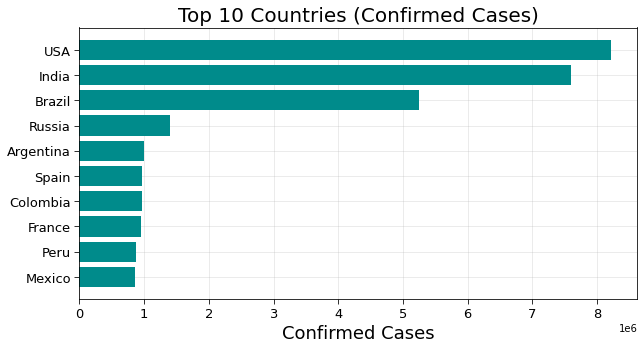

In [ ]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)
plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-10:],df_countries_cases.sort_values('Confirmed')["Confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 Countries (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)


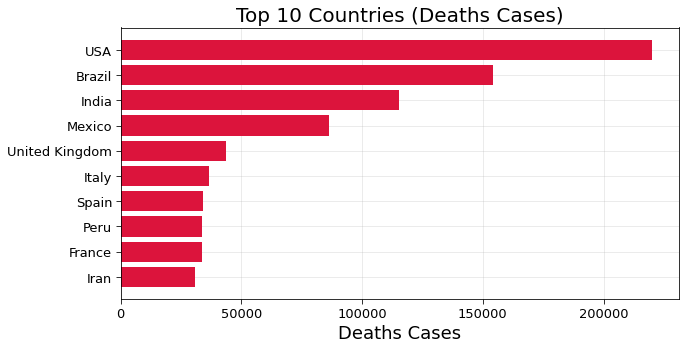

In [ ]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)
plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Deaths')["Deaths"].index[-10:],df_countries_cases.sort_values('Deaths')["Deaths"].values[-10:],color="crimson")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths Cases",fontsize=18)
plt.title("Top 10 Countries (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')


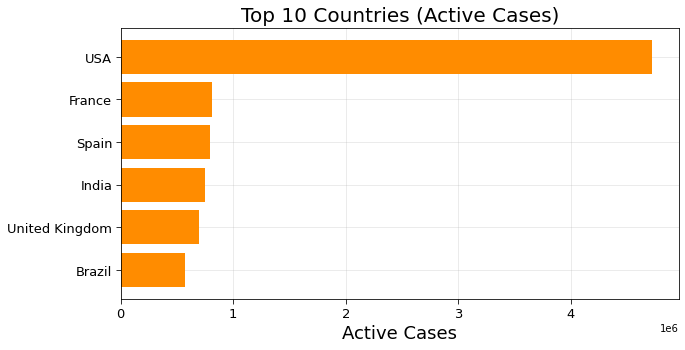

In [ ]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)
plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Active')["Active"].index[-10:],df_countries_cases.sort_values('Active')["Active"].values[-10:],color="darkorange")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Active Cases",fontsize=18)
plt.title("Top 10 Countries (Active Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')

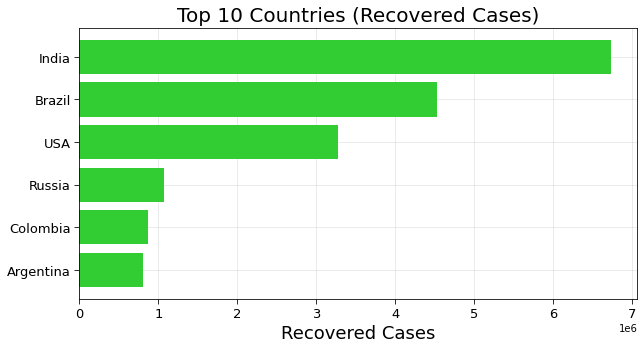

In [ ]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)
plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Recovered')["Recovered"].index[-10:],df_countries_cases.sort_values('Recovered')["Recovered"].values[-10:],color="limegreen")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Recovered Cases",fontsize=18)
plt.title("Top 10 Countries (Recovered Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')

##**Correlation Analysis**
**Plotting Heat map of correlation of confirmed cases, recovered cases, deaths and active cases**

**Country wise Correlation**

In [ ]:
df_countries_cases.corr().style.background_gradient(cmap='Reds')

/usr/local/lib/python3.6/dist-packages/pandas/io/formats/style.py:1126: RuntimeWarning:

All-NaN slice encountered

/usr/local/lib/python3.6/dist-packages/pandas/io/formats/style.py:1127: RuntimeWarning:

All-NaN slice encountered



,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID
Confirmed,1.000000,0.933806,0.935345,0.783329,0.228292,nan,nan,0.024782,-0.013882
Deaths,0.933806,1.000000,0.821009,0.816809,0.254130,nan,nan,0.114395,-0.014342
Recovered,0.935345,0.821009,1.000000,0.512917,0.192496,nan,nan,0.025637,-0.022164
Active,0.783329,0.816809,0.512917,1.000000,0.212681,nan,nan,0.039623,0.029994
Incident_Rate,0.228292,0.254130,0.192496,0.212681,1.000000,nan,nan,-0.066969,-0.096745
People_Tested,nan,nan,nan,nan,nan,nan,nan,nan,nan
People_Hospitalized,nan,nan,nan,nan,nan,nan,nan,nan,nan
Mortality_Rate,0.024782,0.114395,0.025637,0.039623,-0.066969,nan,nan,1.000000,0.324895
UID,-0.013882,-0.014342,-0.022164,0.029994,-0.096745,nan,nan,0.324895,1.000000


**Continent Wise Correlation**

In [ ]:
df_continents_cases.corr().style.background_gradient(cmap='Reds')


/usr/local/lib/python3.6/dist-packages/pandas/io/formats/style.py:1126: RuntimeWarning:

All-NaN slice encountered

/usr/local/lib/python3.6/dist-packages/pandas/io/formats/style.py:1127: RuntimeWarning:

All-NaN slice encountered



,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID
Confirmed,1.000000,0.912774,0.914858,0.600078,0.688547,nan,nan,0.280484,-0.113769
Deaths,0.912774,1.000000,0.712914,0.785041,0.619815,nan,nan,0.171656,-0.251238
Recovered,0.914858,0.712914,1.000000,0.226164,0.543803,nan,nan,0.220926,-0.093113
Active,0.600078,0.785041,0.226164,1.000000,0.575384,nan,nan,0.238049,-0.086587
Incident_Rate,0.688547,0.619815,0.543803,0.575384,1.000000,nan,nan,0.635401,0.304805
People_Tested,nan,nan,nan,nan,nan,nan,nan,nan,nan
People_Hospitalized,nan,nan,nan,nan,nan,nan,nan,nan,nan
Mortality_Rate,0.280484,0.171656,0.220926,0.238049,0.635401,nan,nan,1.000000,0.783887
UID,-0.113769,-0.251238,-0.093113,-0.086587,0.304805,nan,nan,0.783887,1.000000


##**Visualization on Map**

In [ ]:
world_map = folium.Map(location=[10,0], tiles="cartodbpositron", zoom_start=2,max_zoom=6,min_zoom=2)
for i in range(0,len(df_confirmed)):
    folium.Circle(
        location=[df_confirmed.iloc[i]['Lat'], df_confirmed.iloc[i]['Long']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df_confirmed.iloc[i]['country']+"</h5>"+
                  "<div style='text-align:center;'>"+str(np.nan_to_num(df_confirmed.iloc[i]['state']))+"</div>"+
                  "<hr style='margin:10px;'>"+
                  "<ul style='color: #444;list-style-type:circle;align-item:left;paddingleft:20px;padding-right:20px'>"+
                  "<li>Confirmed: "+str(df_confirmed.iloc[i,-1])+"</li>"+
                  "<li>Deaths: "+str(df_deaths.iloc[i,-1])+"</li>"+
                  "<li>Mortality Rate: "+str(np.round(df_deaths.iloc[i,-1]/(df_confirmed.iloc[i,-1]+1.00001)*100,2))+"</li>"+
                  "</ul>",
                  radius=(int((np.log(df_confirmed.iloc[i,-1]+1.00001)))+0.2)*50000,
                  color='#ff6600',
                  fill_color='#ff8533',
                  fill=True).add_to(world_map)
world_map


##**COVID-19 Spread Analysis**
Spread Analysis is in two sections

**Spread Across Globe**

**Spread Trends in the World, Continents and few most affected Countries**

##1. **Spread Across Globe**
Number of countries affected over the time

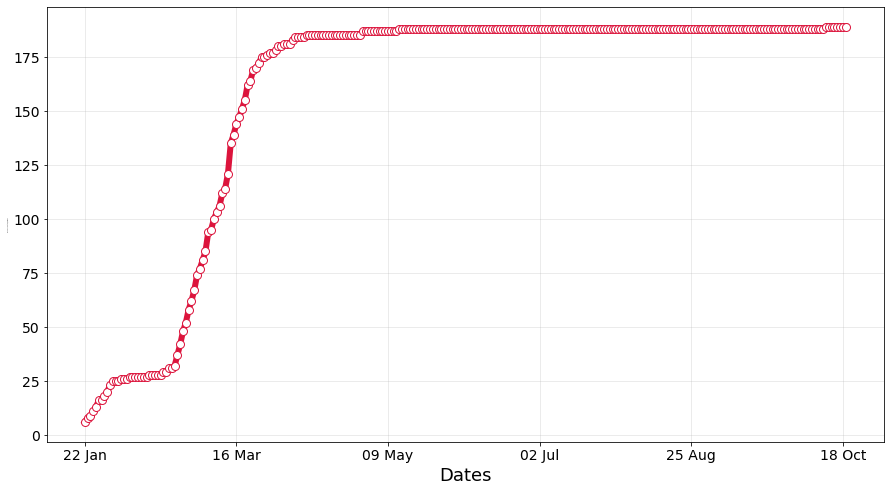

In [ ]:
case_nums_country = df_confirmed.groupby("country").sum().drop(['Lat','Long'],axis
=1).apply(lambda x: x[x > 0].count(), axis =0)
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]
f = plt.figure(figsize=(15,8))
f.add_subplot(111)
marker_style = dict(c="crimson",linewidth=6, linestyle='-', marker='o',markersize=8, markerfacecolor='#ffffff')
plt.plot(d, case_nums_country,**marker_style)
plt.tick_params(labelsize = 14)
plt.xticks(list(np.arange(0,len(d),int(len(d)/5))),d[:-1:int(len(d)/5)]+[d[-1]])
#labels
plt.xlabel("Dates",fontsize=18)
plt.ylabel("Number of Countries/Regions",fontsize=1)
plt.grid(alpha = 0.3)
plt.show()
plt.close()

##**2. Spread Trends in the World, Continents and few most affected Countries**
COVID-19 Global Spread Trends

COVID-19 Spread Trends in Different Continents

COVID-19 Spread Trends in Few Most Affected Countries

COVID-19 Spread Comparison of few most affected countries

COVID-19 Spread Comparison of in different continents

##**COVID-19 Global Spread Trends**

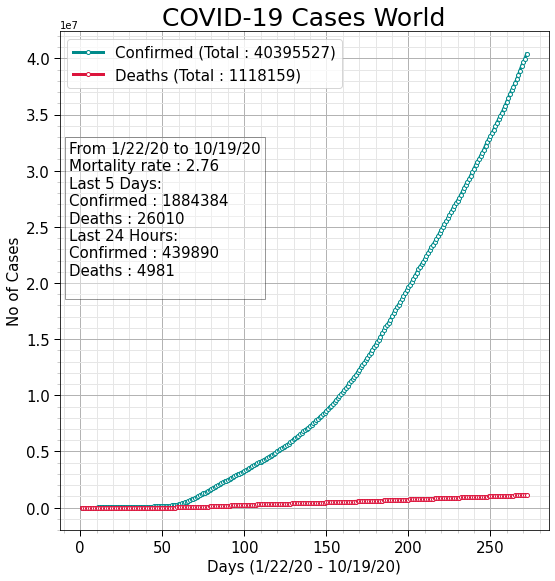

In [ ]:
cols = 1
rows = 1
f = plt.figure(figsize=(10,10*rows))
visualize_covid_cases(df_confirmed, df_deaths,continent = "All",figure = [f,rows,cols, 1])
#plt.savefig

##**COVID-19 Spread Trends in Different Continents**

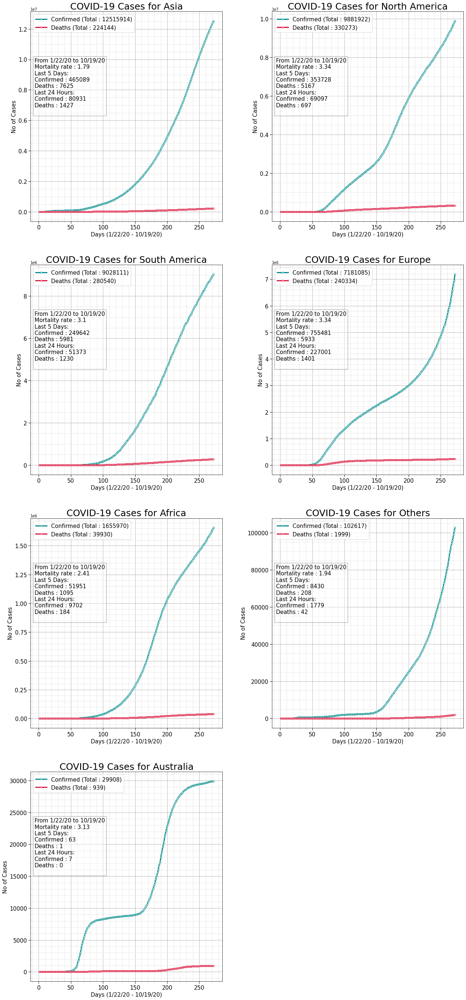

In [ ]:
df_continents= df_confirmed.groupby(["continent"]).sum()
continents = df_continents.sort_values(df_continents.columns[-1],ascending = False).index
cols =2
rows = int(np.ceil(continents.shape[0]/cols))
f = plt.figure(figsize=(20,10*rows))
for i,continent in enumerate(continents):
    visualize_covid_cases(df_confirmed, df_deaths, continent = continent,figure = [f,rows,cols, i+1])
plt.show()

##**COVID-19 Spread Comparison of few most affected countries and INDIA**

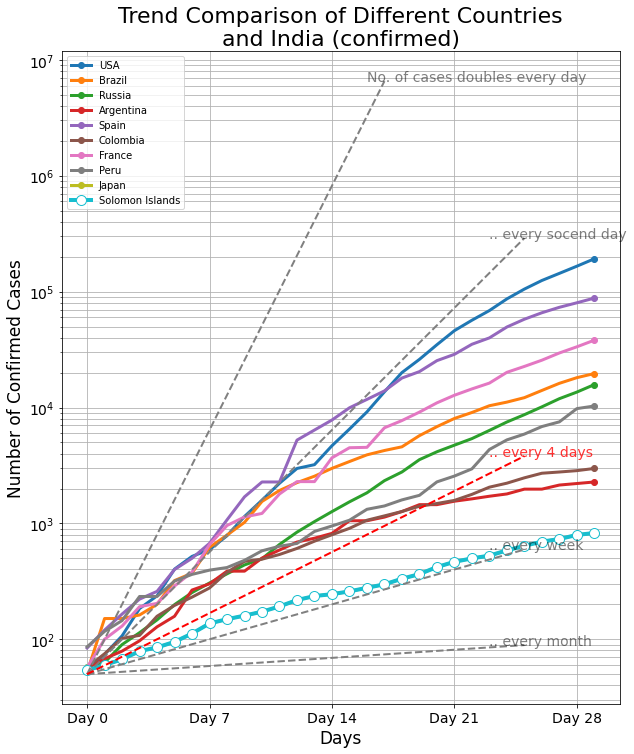

In [ ]:
temp = df_confirmed.groupby('country').sum().drop(["Lat","Long"],axis =1).sort_values(df_confirmed
.columns[-1], ascending= False)
threshold = 50
f = plt.figure(figsize=(10,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i >= 9:
        if country != "India" and country != "Japan" :
            continue
    x = 30
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:x]

    date = np.arange(0,len(t[:x]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k=1) # type: BSpline
    power_smooth = spl(xnew)
    if country != "India":
        plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])
    else:
        marker_style = dict(linewidth=4, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')
plt.plot(date,t,"-.",label = country,**marker_style)
plt.tick_params(labelsize = 14)
plt.xticks(np.arange(0,30,7),[ "Day "+str(i) for i in range(30)][::7])
# Reference lines
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5
)
x = np.arange(0,26)
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every socend day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)
x = np.arange(0,26)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)
x = np.arange(0,26)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)
# India is following trend similar to doulbe the cases in 4 days but it may increase the rate
x = np.arange(0,26)
y = 2**(x/4+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "Red")
plt.annotate(".. every 4 days",(x[-3],y[-1]),color="Red",xycoords="data",fontsize=14,alpha = 0.8)
# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Confirmed Cases",fontsize=17)
plt.title("Trend Comparison of Different Countries\n and India (confirmed) ",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
#plt.savefig(out+'Trend Comparison with India (confirmed).png')
plt.show()

**COVID-19 Spread Comparison of in different continents**

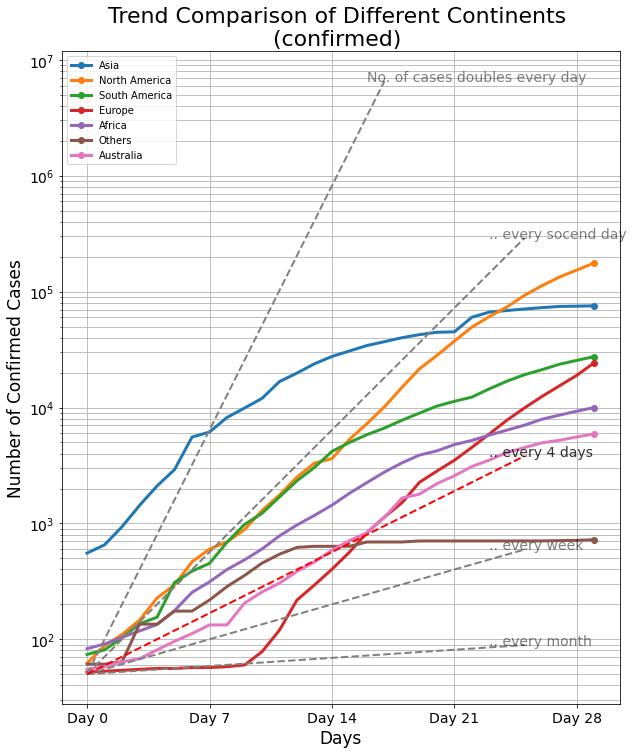

In [ ]:
temp = df_confirmed.groupby('continent').sum().drop(["Lat","Long"],axis =1).sort_values(df_confirmed.columns[-1], ascending= False)
threshold = 50
f = plt.figure(figsize=(10,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i > 10:
        break
    x = 30
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:x]
    date = np.arange(0,len(t[:x]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k=1) # type: BSpline
    power_smooth = spl(xnew)
    plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])
plt.tick_params(labelsize = 14)
plt.xticks(np.arange(0,30,7),[ "Day "+str(i) for i in range(30)][::7])
# Reference lines
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5
)
x = np.arange(0,26)
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every socend day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)
x = np.arange(0,26)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)
x = np.arange(0,26)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)
# India is following trend similar to doulbe the cases in 4 days but it may increase the rate
x = np.arange(0,26)
y = 2**(x/4+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "Red")
plt.annotate(".. every 4 days",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.8)
# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Confirmed Cases",fontsize=17)
plt.title("Trend Comparison of Different Continents \n(confirmed) ",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
#plt.savefig(out+'Trend Comparison of continents (Confirmed).png')
plt.show()

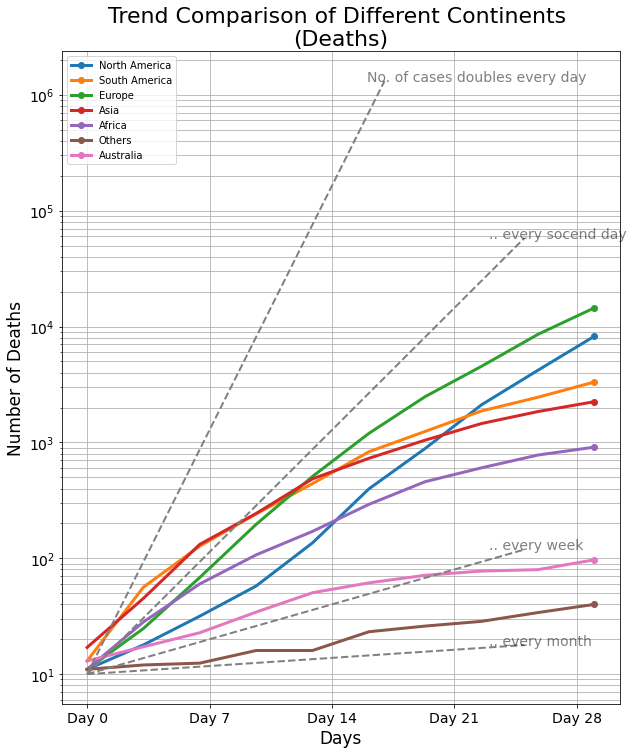

In [ ]:
temp = df_deaths.groupby('continent').sum().drop(["Lat","Long"],axis
=1).sort_values(df_deaths.columns[-1], ascending= False)
threshold = 10
f = plt.figure(figsize=(10,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i > 10:
        break
    x = 30
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:x]
    date = np.arange(0,len(t[:x]))
    xnew = np.linspace(date.min(), date.max(), 10)
    spl = make_interp_spline(date, t, k=1) # type: BSpline
    power_smooth = spl(xnew)
    plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])
plt.tick_params(labelsize = 14)
plt.xticks(np.arange(0,30,7),[ "Day "+str(i) for i in range(30)][::7])
# Reference lines
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5
)
x = np.arange(0,26)
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every socend day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)
x = np.arange(0,26)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)
x = np.arange(0,26)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)
# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Deaths",fontsize=17)
plt.title("Trend Comparison of Different Continents \n(Deaths)",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
#plt.savefig(out+'Trend Comparison continents (deaths).png')
plt.show()

##**Global Prediction**

**Global Trend:**

It is useful to understand the global trend of an increase in the number of cases over time. There is always a pattern in any data, but
the concern is how strongly data follows a pattern. COVID-19 spreads exponentially, positive cases of COVID-19 takes 67 days to
reach 1 Lakhs while it takes only 11 days to reach 2 Lakhs, 4 days to reach 3 Lakhs, and just 2 days to reach 5 Lakhs. This trend
shows how fast it spreads.


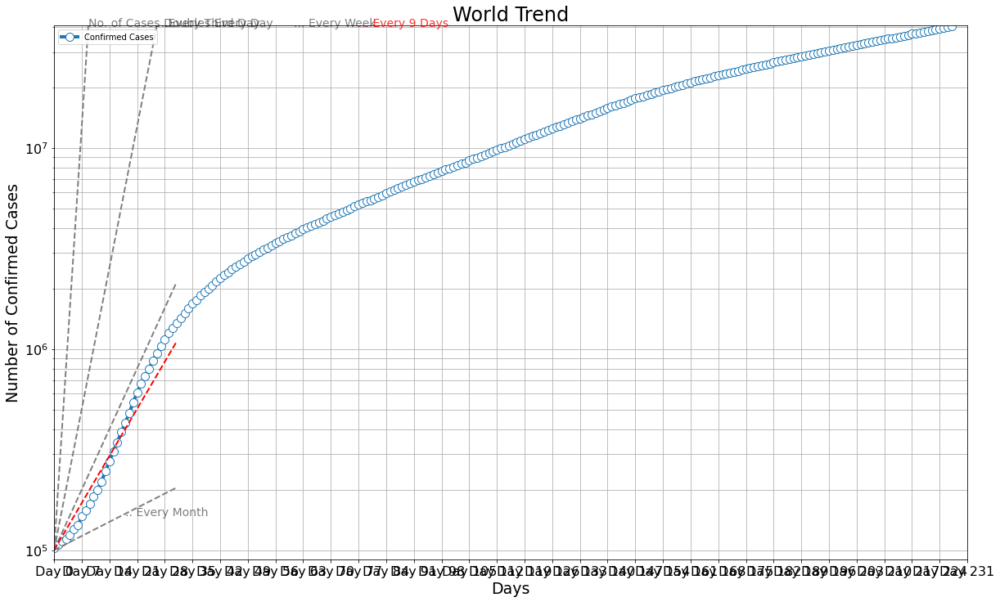

In [ ]:
temp_data = df_confirmed.iloc[:,5:].sum(axis =0)
f = plt.figure(figsize=(20,12))
f.add_subplot(111)
threshold = 100000
t = temp_data.values
t = t[t >threshold]
date = np.arange(0,len(t[:]))
xnew = np.linspace(date.min(), date.max(), 10)
spl = make_interp_spline(date, t, k=1) # type: BSpline
power_smooth = spl(xnew)
marker_style = dict(linewidth=4, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')
plt.plot(date,t,"-.",label="Confirmed Cases",**marker_style)
# Reference lines
x = np.arange(0,32)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of Cases Doubles Every Day",
(np.log2((t.max()-threshold)/threshold),t.max()-threshold/2),xycoords="data",fontsize=14,alpha = 0.5)
x = np.arange(0,32)
y = 2**(x/3+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("...Every Third Day",
(np.log2((t.max()-threshold)/threshold)*3,t.max()-threshold),xycoords="data",fontsize=14,alpha = 0.5)
x = np.arange(0,32)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("... Every Week",(np.log2((t.max()-threshold)/threshold)*7,t.max()-threshold),xycoords="data",fontsize=14,alpha = 0.5)
x = np.arange(0,32)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. Every Month",(18,2**(17/30+np.log2(threshold))),xycoords="data",fontsize=14,alpha= 0.5)
x = np.arange(0,32)
y = 2**(x/9+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "Red")
plt.annotate(".. Every 9 Days",(np.log2((t.max()-threshold)/threshold)*9,t.max()-threshold),color="Red",xycoords="data",fontsize=14,alpha = 0.8)
plt.xlim(date[0],date[-1])
plt.ylim(threshold - threshold/10,t.max()+threshold)
# plot Params
# plt.tight_layout()
plt.tick_params(labelsize = 16)
plt.xticks(np.arange(0,len(t[:])+7,7),[ "Day "+str(i) for i in range(len(t[:])+7)][::7])
plt.xlabel("Days",fontsize=19)
plt.ylabel("Number of Confirmed Cases",fontsize=19)
plt.title("World Trend",fontsize=24)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
#plt.savefig(out+"World Trend Confirmed cases.png")
plt.show()



**COVID-19 Mortality Rate Variation Over Period of Time**

For any epidemic the one of the most important evaluation is Mortality Rate. It is the measure of number of deaths in a particular
population during a specific interval.

1st curve shows how the mortality rate varies from 22 JAN 2020 to till date all over the world.

2nd Curve shows the variation of mortality rate in different continents over time.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning:

invalid value encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning:

invalid value encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning:

invalid value encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning:

invalid value encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning:

invalid value encountered in true_divide



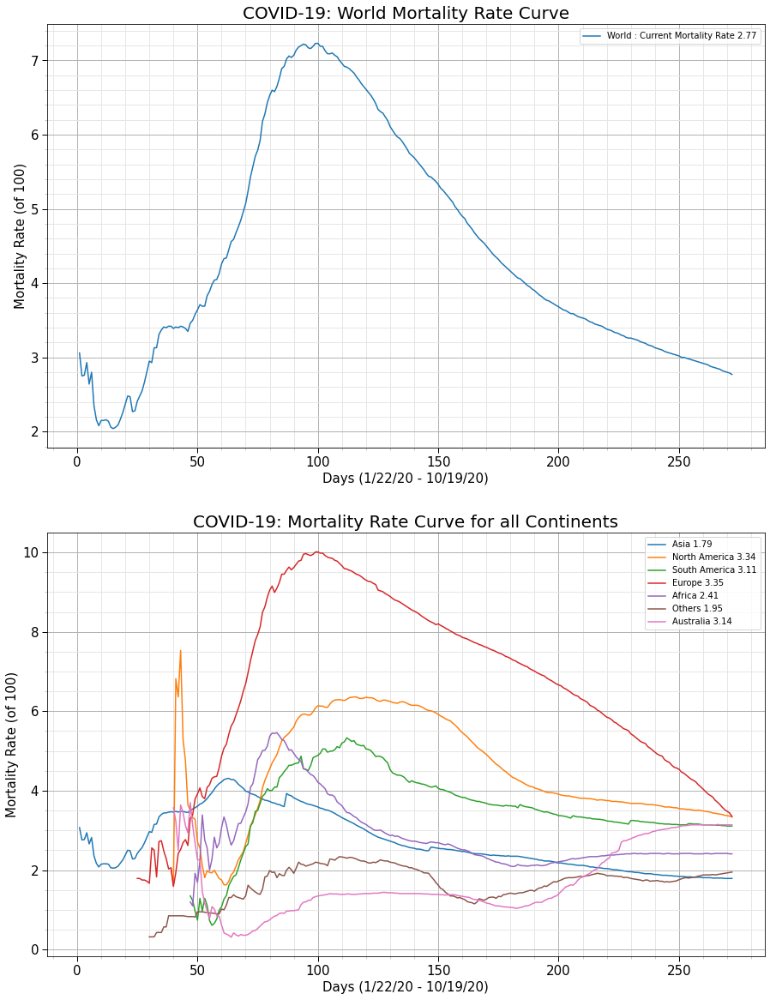

In [ ]:
df_continents= df_confirmed.groupby(["continent"]).sum()
continents = df_continents.sort_values(df_continents.columns[-1],ascending = False).index
continents = ["All"]+list(continents)
cols =1
rows = 2
axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","Mortality Rate (of 100)"]
f = plt.figure(figsize=(15,10*rows))
#SubPlot 1
ax = f.add_subplot(211)
mortality_rate = get_mortality_rate(df_confirmed,df_deaths,continent=continents[0])
plt.plot(np.arange(1,mortality_rate.shape[0]+1),mortality_rate,label = "World : Current Mortality Rate "+str(mortality_rate[-1]))
plt_title = "COVID-19: World Mortality Rate Curve"
plot_params(ax,axis_label,plt_title)
# Legend Location
l = plt.legend(loc= "best")
#SubPlot 2
ax = f.add_subplot(212)
for i, continent in enumerate(continents[1:]):
    mortality_rate = get_mortality_rate(df_confirmed,df_deaths,continent=continent)
    plt.plot(np.arange(1+mortality_rate[mortality_rate == 0].shape[0],mortality_rate[mortality_rate== 0].shape[0]+mortality_rate[mortality_rate > 0].shape[0]+1),mortality_rate[mortality_rate > 0],label = continents[i+1]+" "+str(mortality_rate[-1]))
plt_title = "COVID-19: Mortality Rate Curve for all Continents"
plot_params(ax,axis_label,plt_title)
# Legend Location
l = plt.legend(loc= "best")
plt.minorticks_on()
#plt.savefig(out+'Mortality rate.png')
plt.show()

##**COVID-19: Change in Mortality Rate of Each Countries Over Time**

In [ ]:
df_data = df_table.groupby(['Last_Update', 'Country_Region'])['Confirmed', 'Deaths','continent'].max().reset_index()
df_data["Last_Update"] = pd.to_datetime( df_data["Last_Update"]).dt.strftime('%m/%d/%Y')
fig = px.scatter(df_data, y=100*df_data["Deaths"]/(df_data["Confirmed"]+1),
x= df_data["Confirmed"]+1,
range_y = [-1,18],
range_x = [1,df_data["Confirmed"].max()+10000],
color= "continent", hover_name="Country_Region",
hover_data=["Confirmed","Deaths"],
range_color= [0, max(np.power(df_data["Confirmed"],0.3))],
animation_frame="Last_Update",
animation_group="Country_Region",
color_continuous_scale=px.colors.sequential.Plasma,
title='COVID-19: Change in Mortality Rate of Each Countries Over Time',
size = np.power(df_data["Confirmed"]+1,0.3)-0.5,
size_max = 30,
log_x=True,
height =700,
)
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.update_xaxes(title_text="Confirmed Cases (Log Scale)")
fig.update_yaxes(title_text="Mortality Rate (%)")
fig.show()


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



 ##**Cumulative Confirmed Cases and Cumulative Recovery Vs Cumulative Deaths
Analysis.**

The variation of Cumulative Confirmed Cases and Cumulative Recovery with Cumulative Deaths can show a trend. These 2 curves
depict the same. Also, these curves should be a straight line as shown in the 1st curve, but the 2nd curve is not showing that trend,
and as the number of recovered cases is increasing, death is increasing at a faster rate.

1st curve: Cumulative Confirmed Cases VS Cumulative Deaths

2nd curve: Cululative Recovery VS Cumulative Deaths


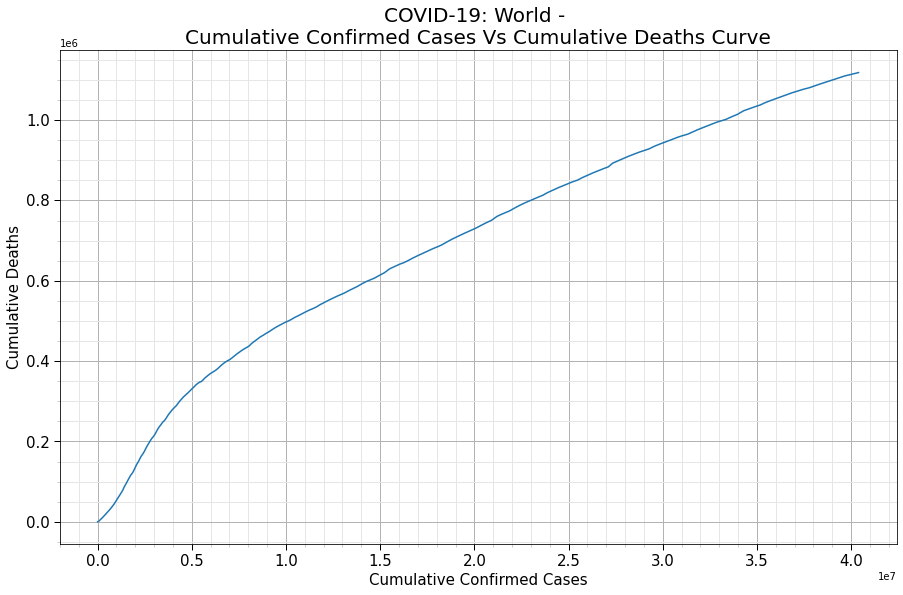

In [ ]:
cols =1
rows = 2
f = plt.figure(figsize=(15,10*rows))
# SubPlot 1
ax = f.add_subplot(211)
plt.plot(np.sum(np.asarray(df_confirmed.iloc[:,5:]),axis = 0),np.sum(np.asarray(df_deaths.iloc[:,5
:]),axis = 0))
axis_label = ["Cumulative Confirmed Cases","Cumulative Deaths"]
plt_title = "COVID-19: World - \nCumulative Confirmed Cases Vs Cumulative Deaths Curve"
plot_params(ax,axis_label,plt_title)


plt.minorticks_on()

plt.show()

##**Variation of Deaths vs Confirmed cases of different cuntries over time**

In [ ]:
df_data = df_table.groupby(['Last_Update', 'Country_Region'])['Confirmed', 'Deaths','continent'].max().reset_index()
df_data["Last_Update"] = pd.to_datetime( df_data["Last_Update"]).dt.strftime('%m/%d/%Y')
fig = px.scatter(df_data, y=df_data["Deaths"],
x= df_data["Confirmed"]+1,
range_y = [1,df_data["Deaths"].max()+1000],
range_x = [1,df_data["Confirmed"].max()+10000],
color= "continent", hover_name="Country_Region",
hover_data=["Confirmed","Deaths"],
range_color= [0, max(np.power(df_data["Confirmed"],0.3))],
animation_frame="Last_Update",
animation_group="Country_Region",
color_continuous_scale=px.colors.sequential.Plasma,
title='COVID-19: Change Deaths vs Cofirmed of Each Countries Over Time',
size = np.power(df_data["Confirmed"]+1,0.3)-0.5,
size_max = 30,
log_x=True,
log_y=True,
height =700,
)
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.update_xaxes(title_text="Confirmed Cases (Log Scale)")
fig.update_yaxes(title_text="Deaths Rate (Log Scale)")
fig.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



##**COVID-19 : INDIA**
Few basic visualization related to India. I will be updating with more visualization in further commits. i am also working on
Paitent Data Insights. Adding Soon

Dataset: This dataset is provided by https://api.rootnet.in/


##**Analysis of Tests done in India**

In [ ]:
#For runing this command connect to your internet
df_india_test = pd.io.json.json_normalize(requests.get('https://api.rootnet.in/covid19-in/stats/testing/history').json()['data']).rename(columns =
{"totalIndividualsTested":"c_individualtest","totalPositiveCases":"c_positive","totalSamplesTested":"c_tests"})


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: FutureWarning:

pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead



In [ ]:
df_india_test["p2t_ratio"]= np.round(100*df_india_test["c_positive"]/df_india_test["c_tests"],2)
df_india_test["positive"] = df_india_test["c_positive"].diff()
df_india_test["tests"] = df_india_test["c_tests"].diff()
df_india_test["p2t_ratio"]= np.round(100*df_india_test["positive"]/df_india_test["tests"],2)


**Total tests done till date (30 March 2020) in India**

In [ ]:
df_india_test["c_tests"][-1:].values[0]


96116771.0

**Test Conducted per Million People**

In [ ]:
np.round(1000000*df_india_test["c_tests"][-1:].values[0]/1300000000,2)


73935.98

##**COVID19 Cases in India**

In [ ]:
india_data_json = requests.get('https://api.rootnet.in/covid19-in/unofficial/covid19india.org/statewise').json()
df_india = pd.io.json.json_normalize(india_data_json['data']['statewise'])
df_india = df_india.set_index("state")


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: FutureWarning:

pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead



In [ ]:
total = df_india.sum()
total.name = "Total"
pd.DataFrame(total).transpose().style.background_gradient(cmap='Wistia',axis=1)

,confirmed,recovered,deaths,active
Total,7596667,6730617,115252,749537


In [ ]:
df_india.style.background_gradient(cmap='Wistia')

,confirmed,recovered,deaths,active
state,,,,
Maharashtra,1601365,1384879,42240,173759
Andhra Pradesh,786050,744532,6453,35065
Karnataka,770604,653829,10542,106214
Tamil Nadu,690936,642152,10694,38090
Uttar Pradesh,456865,418685,6685,31495
Delhi,333171,304561,6040,22570
Kerala,346882,252868,1183,92732
West Bengal,325028,284325,6119,34584
Odisha,272250,249575,1221,21454


**States with Reported Deaths**

In [ ]:
df_india[df_india['deaths'] > 0].style.background_gradient(cmap='Wistia')

,confirmed,recovered,deaths,active
state,,,,
Maharashtra,1601365,1384879,42240,173759
Andhra Pradesh,786050,744532,6453,35065
Karnataka,770604,653829,10542,106214
Tamil Nadu,690936,642152,10694,38090
Uttar Pradesh,456865,418685,6685,31495
Delhi,333171,304561,6040,22570
Kerala,346882,252868,1183,92732
West Bengal,325028,284325,6119,34584
Odisha,272250,249575,1221,21454


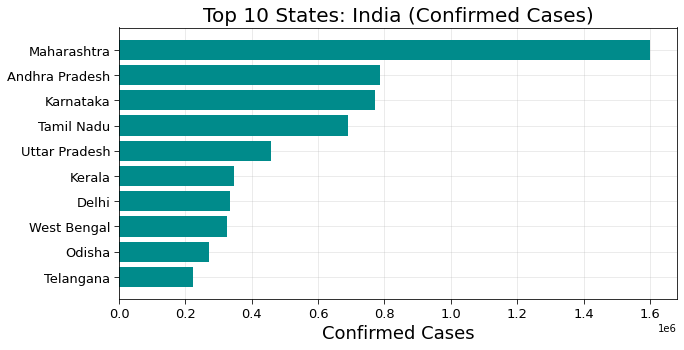

In [ ]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)
plt.axes(axisbelow=True)
plt.barh(df_india.sort_values('confirmed')["confirmed"].index[-10:],df_india.sort_values('confirmed')["confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 States: India (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 States_India (Confirmed Cases).png')

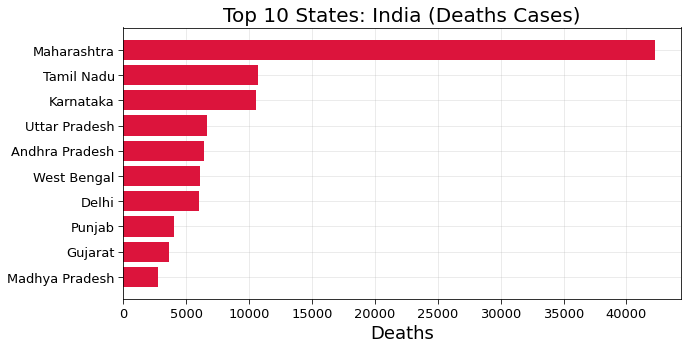

In [ ]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)
plt.axes(axisbelow=True)
plt.barh(df_india.sort_values('deaths')["deaths"].index[-10:],df_india.sort_values('deaths')["deaths"].values[-10:],color="crimson")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths",fontsize=18)
plt.title("Top 10 States: India (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 States_India (Deaths Cases).png')


##**Correlation**

In [ ]:
df_india.corr().style.background_gradient(cmap='Blues')

,confirmed,recovered,deaths,active
confirmed,1.000000,0.998444,0.920923,0.904265
recovered,0.998444,1.000000,0.912604,0.879439
deaths,0.920923,0.912604,1.000000,0.855973
active,0.904265,0.879439,0.855973,1.000000


##**Conclusion**
There are hundreds of coronaviruses, most of which circulate in animals. Only seven of these viruses infect humans and four of them
cause symptoms of the common cold. But, three times in the last 20 years, a coronavirus has jumped from animals to humans to
cause severe disease.

SARS, a beta coronavirus emerged in 2002 and was controlled mainly by aggressive public health measures. There have been no
new cases since 2004. MERS emerged in 2012, still exists in camels, and can infect people who have close contact with them.

COVID-19, a new and sometimes deadly respiratory illness that is believed to have originated in a live animal market in China, has
spread rapidly throughout that country and the world.

The new coronavirus was first detected in Wuhan, China in December 2019. Tens of thousands of people were infected in China,
with the virus spreading easily from person-to-person in many parts of that country.

The novel coronavirus infections were at first associated with travel from Wuhan, but the virus has now established itself in 177
Out[55]:
confirmed recovered deaths active
confirmed 1.000000 0.998287 0.921107 0.905507
recovered 0.998287 1.000000 0.911909 0.879502
deaths 0.921107 0.911909 1.000000 0.861551
active 0.905507 0.879502 0.861551 1.000000
countries and territories around the world in a rapidly expanding pandemic. Health officials in the United States and around the world
are working to contain the spread of the virus through public health measures such as social distancing, contact tracing, testing,
quarantines and travel restrictions. Scientists are working to find medications to treat the disease and to develop a vaccine.

The World Health Organization declared the novel coronavirus outbreak “a public health emergency of international concern” on
January 30. On March 11, 2020 after sustained spread of the disease outside of China, the World Health Organization declared the
COVID-19 epidemic a pandemic. Public health measures like ones implemented in China and now around the world, will hopefully
blunt the spread of the virus while treatments and a vaccine are developed to stop it.
